In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
import torchvision.transforms.functional as TF

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import os
from pathlib import Path
from tqdm.auto import tqdm
from sklearn.metrics import confusion_matrix, classification_report
import warnings
warnings.filterwarnings('ignore')

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f" Device utilisé : {device}")

 Device utilisé : cuda


In [2]:
import kagglehub

path = kagglehub.dataset_download("engeddy/astrophysical-objects-image-dataset")

print("Path to dataset files:", path)

100%|██████████| 1.41G/1.41G [00:13<00:00, 110MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/engeddy/astrophysical-objects-image-dataset/versions/1


In [3]:

dataset_path = "/root/.cache/kagglehub/datasets/engeddy/astrophysical-objects-image-dataset/versions/1/astro_dataset_maxia"

def explore_dataset(base_path):
    """Explore et affiche la structure du dataset"""
    print(" Structure du dataset:\n")

    classes = {}
    for split in ['test', 'training', 'validation']:
        split_path = os.path.join(base_path, 'astro_dataset_maxia', split)
        if os.path.exists(split_path):
            class_folders = [d for d in os.listdir(split_path)
                           if os.path.isdir(os.path.join(split_path, d))]
            classes[split] = {}

            print(f"\n{split.upper()}:")
            for cls in sorted(class_folders):
                cls_path = os.path.join(split_path, cls)
                n_images = len([f for f in os.listdir(cls_path)
                              if f.endswith(('.jpg', '.png', '.jpeg'))])
                classes[split][cls] = n_images
                print(f"  • {cls:15s}: {n_images:4d} images")

    return classes

classes_info = explore_dataset(dataset_path)

 Structure du dataset:


TEST:
  • asteroid       :   29 images
  • black_hole     :   31 images
  • earth          :   29 images
  • galaxy         :   30 images
  • jupiter        :   28 images
  • mars           :   30 images
  • mercury        :   28 images
  • neptune        :   28 images
  • pluto          :   28 images
  • saturn         :   28 images
  • uranus         :   28 images
  • venus          :   28 images

TRAINING:
  • asteroid       :  212 images
  • black_hole     :  185 images
  • earth          :  209 images
  • galaxy         :  185 images
  • jupiter        :  202 images
  • mars           :  215 images
  • mercury        :  201 images
  • neptune        :  202 images
  • pluto          :  201 images
  • saturn         :  201 images
  • uranus         :  202 images
  • venus          :  201 images

VALIDATION:
  • asteroid       :   42 images
  • black_hole     :   48 images
  • earth          :   59 images
  • galaxy         :   49 images
  • jupiter        : 

Visualisation d'Échantillons

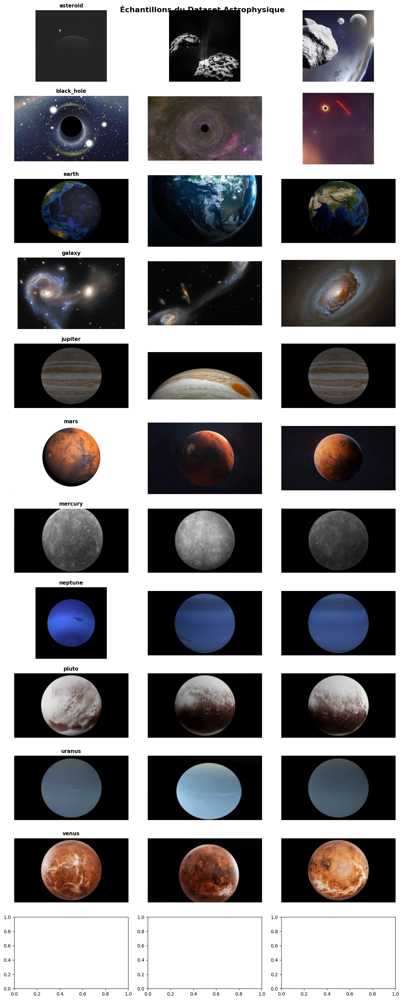

In [4]:
def visualize_samples(base_path, n_samples=3):
    train_path = os.path.join(base_path, 'astro_dataset_maxia', 'training')
    classes = sorted(os.listdir(train_path))

    fig, axes = plt.subplots(len(classes), n_samples, figsize=(12, 2.5*len(classes)))
    fig.suptitle(' Échantillons du Dataset Astrophysique', fontsize=16, fontweight='bold')

    for i, cls in enumerate([c for c in classes if c != "saturn"]):
        cls_path = os.path.join(train_path, cls)
        images = [f for f in os.listdir(cls_path) if f.endswith(('.jpg', '.png', '.jpeg'))][20:n_samples+20]

        for j, img_name in enumerate(images):
            img = Image.open(os.path.join(cls_path, img_name))
            axes[i, j].imshow(img)
            axes[i, j].axis('off')
            if j == 0:
                axes[i, j].set_title(f"{cls}", fontweight='bold', fontsize=11)

    plt.tight_layout()
    plt.show()

visualize_samples(dataset_path)

In [5]:
class AstroDataset(Dataset):

    def __init__(self, root_dir, split='training', transform=None):
        self.root_dir = os.path.join(root_dir, 'astro_dataset_maxia', split)
        self.transform = transform
        self.classes = sorted(os.listdir(self.root_dir))
        self.class_to_idx = {cls: idx for idx, cls in enumerate(self.classes)}

        # Charger tous les chemins d'images
        self.images = []
        self.labels = []

        for cls in self.classes:
            cls_path = os.path.join(self.root_dir, cls)
            for img_name in os.listdir(cls_path):
                if img_name.endswith(('.jpg', '.png', '.jpeg')):
                    self.images.append(os.path.join(cls_path, img_name))
                    self.labels.append(self.class_to_idx[cls])

        print(f" {split.capitalize()}: {len(self.images)} images chargées")

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

# Créer un petit test
test_dataset = AstroDataset(dataset_path, split='training')
print(f" Nombre de classes: {len(test_dataset.classes)}")
print(f" Classes: {test_dataset.classes}")

 Training: 2416 images chargées
 Nombre de classes: 12
 Classes: ['asteroid', 'black_hole', 'earth', 'galaxy', 'jupiter', 'mars', 'mercury', 'neptune', 'pluto', 'saturn', 'uranus', 'venus']


Transformations pour l'augmentation

In [20]:
train_transforms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])

In [21]:
val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])


In [22]:
train_dataset = AstroDataset(dataset_path, split='training', transform=train_transforms)
val_dataset = AstroDataset(dataset_path, split='validation', transform=val_transforms)
test_dataset = AstroDataset(dataset_path, split='test', transform=val_transforms)


 Training: 2416 images chargées
 Validation: 658 images chargées
 Test: 345 images chargées


In [23]:
batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size,
                         shuffle=True, num_workers=0, pin_memory=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size,
                       shuffle=False, num_workers=0, pin_memory=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size,
                        shuffle=False, num_workers=0, pin_memory=False)


In [25]:
print(f" Batches - Train: {len(train_loader)}, Val: {len(val_loader)}, Test: {len(test_loader)}")

 Batches - Train: 76, Val: 21, Test: 11


Création du Modèle ResNet18

In [11]:
def create_resnet18_finetuned(num_classes, freeze_first_two_layers=True):
    # Charger ResNet18 pré-entraîné
    model = models.resnet18(pretrained=True)

    # Architecture ResNet18:
    # layer1, layer2, layer3, layer4

    if freeze_first_two_layers:
        # Geler conv1, bn1, layer1 et layer2
        for param in model.conv1.parameters():
            param.requires_grad = False
        for param in model.bn1.parameters():
            param.requires_grad = False
        for param in model.layer1.parameters():
            param.requires_grad = False
        for param in model.layer2.parameters():
            param.requires_grad = False

        # Laisser layer3 et layer4 entraînables
        for param in model.layer3.parameters():
            param.requires_grad = True
        for param in model.layer4.parameters():
            param.requires_grad = True

    # Remplacer la couche finale
    num_features = model.fc.in_features
    model.fc = nn.Linear(num_features, num_classes)

    return model

In [26]:
num_classes = len(train_dataset.classes)
model = create_resnet18_finetuned(num_classes, freeze_first_two_layers=True)
model = model.to(device)

In [27]:
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

In [28]:
print(f" Nombre de classes: {num_classes}")
print(f" Paramètres totaux: {total_params:,}")
print(f" Paramètres entraînables: {trainable_params:,} ({100*trainable_params/total_params:.1f}%)")

 Nombre de classes: 12
 Paramètres totaux: 11,182,668
 Paramètres entraînables: 10,499,596 (93.9%)


In [15]:
def train_epoch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    pbar = tqdm(loader, desc='Training', leave=False)
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

        pbar.set_postfix({'loss': f'{running_loss/total:.4f}',
                         'acc': f'{100.*correct/total:.2f}%'})

    return running_loss / len(loader), 100. * correct / total

In [16]:
def validate(model, loader, criterion, device):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        pbar = tqdm(loader, desc='Validation', leave=False)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()

            pbar.set_postfix({'loss': f'{running_loss/total:.4f}',
                             'acc': f'{100.*correct/total:.2f}%'})

    return running_loss / len(loader), 100. * correct / total

Entraînement du Modèle

In [31]:
num_epochs = 10
learning_rate = 0.001

In [32]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()),
                       lr=learning_rate)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max',
                                                  factor=0.5, patience=3)

In [33]:
history = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': []
}

best_val_acc = 0.0
best_model_path = 'best_resnet18_astro.pth'

for epoch in range(num_epochs):
    print(f"{'='*60}")
    print(f"Époque {epoch+1}/{num_epochs}")
    print(f"{'='*60}")

    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)

    val_loss, val_acc = validate(model, val_loader, criterion, device)

    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)

    scheduler.step(val_acc)

    print(f"\n Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f" Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), best_model_path)
        print(f" Meilleur modèle sauvegardé! (Val Acc: {best_val_acc:.2f}%)")

    print()

print(f"\n Entraînement terminé!")
print(f" Meilleure précision validation: {best_val_acc:.2f}%")

Époque 1/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.3844 | Train Acc: 89.03%
 Val Loss: 0.2214 | Val Acc: 94.07%
 Meilleur modèle sauvegardé! (Val Acc: 94.07%)

Époque 2/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.1666 | Train Acc: 95.57%
 Val Loss: 0.1080 | Val Acc: 97.11%
 Meilleur modèle sauvegardé! (Val Acc: 97.11%)

Époque 3/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.1390 | Train Acc: 96.11%
 Val Loss: 0.1230 | Val Acc: 96.66%

Époque 4/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.0962 | Train Acc: 97.35%
 Val Loss: 0.0613 | Val Acc: 98.02%
 Meilleur modèle sauvegardé! (Val Acc: 98.02%)

Époque 5/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.1155 | Train Acc: 96.81%
 Val Loss: 0.0772 | Val Acc: 97.87%

Époque 6/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.0688 | Train Acc: 97.93%
 Val Loss: 0.0315 | Val Acc: 99.54%
 Meilleur modèle sauvegardé! (Val Acc: 99.54%)

Époque 7/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.0549 | Train Acc: 98.39%
 Val Loss: 0.0952 | Val Acc: 97.42%

Époque 8/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.0831 | Train Acc: 97.68%
 Val Loss: 0.0360 | Val Acc: 99.09%

Époque 9/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.0534 | Train Acc: 98.43%
 Val Loss: 0.0281 | Val Acc: 99.54%

Époque 10/10


Training:   0%|          | 0/76 [00:00<?, ?it/s]

Validation:   0%|          | 0/21 [00:00<?, ?it/s]


 Train Loss: 0.0384 | Train Acc: 99.21%
 Val Loss: 0.0373 | Val Acc: 99.09%


 Entraînement terminé!
 Meilleure précision validation: 99.54%


 Meilleur modèle chargé!


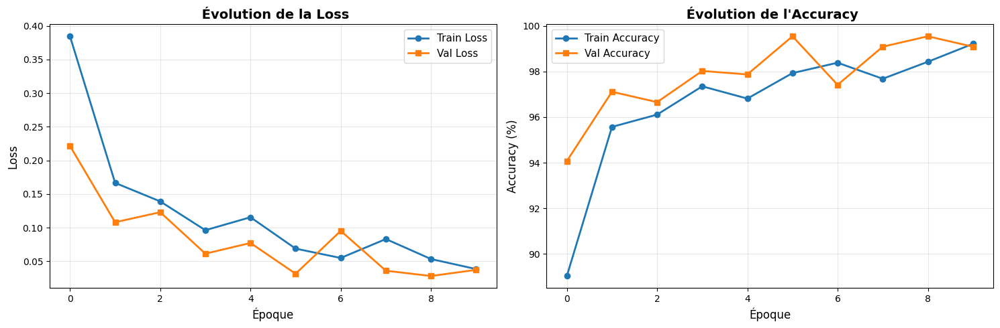

In [34]:
model.load_state_dict(torch.load(best_model_path))
print(" Meilleur modèle chargé!")

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Loss
axes[0].plot(history['train_loss'], label='Train Loss', marker='o', linewidth=2)
axes[0].plot(history['val_loss'], label='Val Loss', marker='s', linewidth=2)
axes[0].set_xlabel('Époque', fontsize=12)
axes[0].set_ylabel('Loss', fontsize=12)
axes[0].set_title(' Évolution de la Loss', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=11)
axes[0].grid(True, alpha=0.3)

# Accuracy
axes[1].plot(history['train_acc'], label='Train Accuracy', marker='o', linewidth=2)
axes[1].plot(history['val_acc'], label='Val Accuracy', marker='s', linewidth=2)
axes[1].set_xlabel('Époque', fontsize=12)
axes[1].set_ylabel('Accuracy (%)', fontsize=12)
axes[1].set_title(' Évolution de l\'Accuracy', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=11)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [35]:
def evaluate_model(model, loader, device, class_names):
    """Évalue le modèle et retourne les métriques"""
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in tqdm(loader, desc='Évaluation'):
            images = images.to(device)
            outputs = model(images)
            _, predicted = outputs.max(1)

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.numpy())

    accuracy = 100. * np.sum(np.array(all_preds) == np.array(all_labels)) / len(all_labels)

    print(f"\n{'='*60}")
    print(f" RÉSULTATS SUR LE TEST SET")
    print(f"{'='*60}")
    print(f"Accuracy: {accuracy:.2f}%\n")

    print(" Classification Report:")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    return all_preds, all_labels, accuracy

test_preds, test_labels, test_acc = evaluate_model(model, test_loader, device,
                                                     test_dataset.classes)

Évaluation:   0%|          | 0/11 [00:00<?, ?it/s]


 RÉSULTATS SUR LE TEST SET
Accuracy: 97.10%

 Classification Report:
              precision    recall  f1-score   support

    asteroid       0.91      1.00      0.95        29
  black_hole       0.97      0.90      0.93        31
       earth       1.00      1.00      1.00        29
      galaxy       1.00      1.00      1.00        30
     jupiter       0.93      1.00      0.97        28
        mars       0.94      1.00      0.97        30
     mercury       1.00      1.00      1.00        28
     neptune       0.96      0.96      0.96        28
       pluto       1.00      1.00      1.00        28
      saturn       1.00      0.89      0.94        28
      uranus       0.96      0.96      0.96        28
       venus       1.00      0.93      0.96        28

    accuracy                           0.97       345
   macro avg       0.97      0.97      0.97       345
weighted avg       0.97      0.97      0.97       345



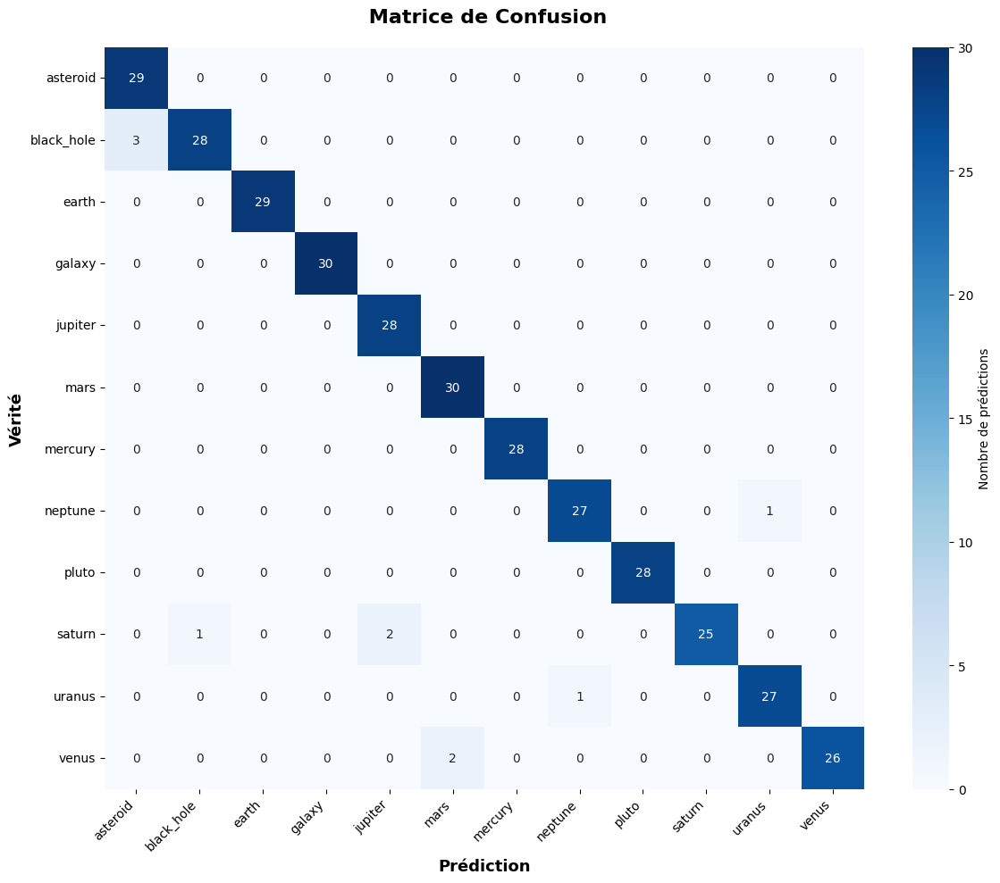

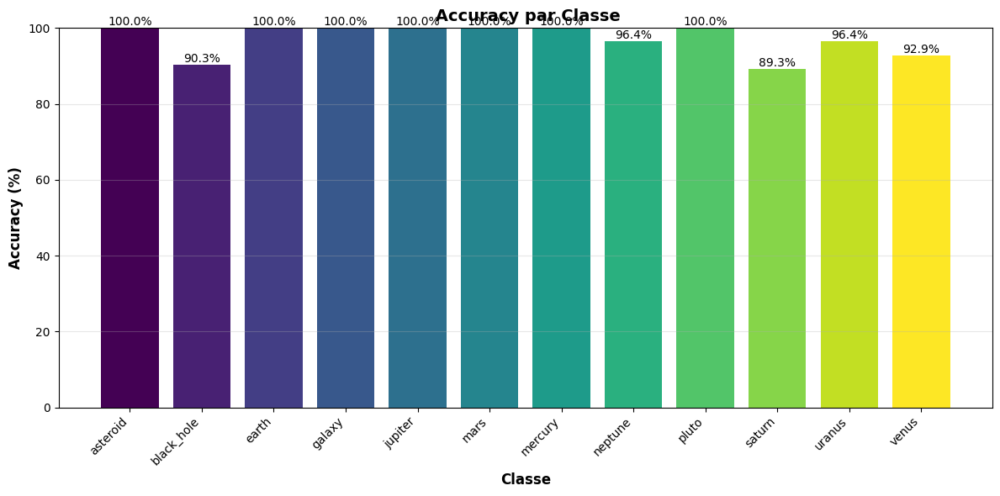

In [36]:
def plot_confusion_matrix(labels, preds, class_names):
    cm = confusion_matrix(labels, preds)

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names,
                cbar_kws={'label': 'Nombre de prédictions'})
    plt.xlabel('Prédiction', fontsize=13, fontweight='bold')
    plt.ylabel('Vérité', fontsize=13, fontweight='bold')
    plt.title(' Matrice de Confusion', fontsize=16, fontweight='bold', pad=20)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

    class_accuracies = cm.diagonal() / cm.sum(axis=1)

    plt.figure(figsize=(12, 6))
    bars = plt.bar(range(len(class_names)), class_accuracies * 100,
                   color=plt.cm.viridis(np.linspace(0, 1, len(class_names))))
    plt.xlabel('Classe', fontsize=12, fontweight='bold')
    plt.ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
    plt.title(' Accuracy par Classe', fontsize=14, fontweight='bold')
    plt.xticks(range(len(class_names)), class_names, rotation=45, ha='right')
    plt.ylim(0, 100)
    plt.grid(axis='y', alpha=0.3)

    # Ajouter les valeurs sur les barres
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}%', ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.show()

plot_confusion_matrix(test_labels, test_preds, test_dataset.classes)

In [38]:
!pip install grad-cam  -q


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 86.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [39]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

In [42]:
def get_gradcam_visualization(model, image_tensor, true_label, pred_label,
                               class_names, target_layer):

    cam = GradCAM(model=model, target_layers=[target_layer])

    input_tensor = image_tensor.unsqueeze(0)

    targets = [ClassifierOutputTarget(pred_label)]
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
    grayscale_cam = grayscale_cam[0, :]

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = image_tensor.cpu().numpy().transpose(1, 2, 0)
    img = std * img + mean
    img = np.clip(img, 0, 1)

    visualization = show_cam_on_image(img, grayscale_cam, use_rgb=True)

    return img, visualization, grayscale_cam


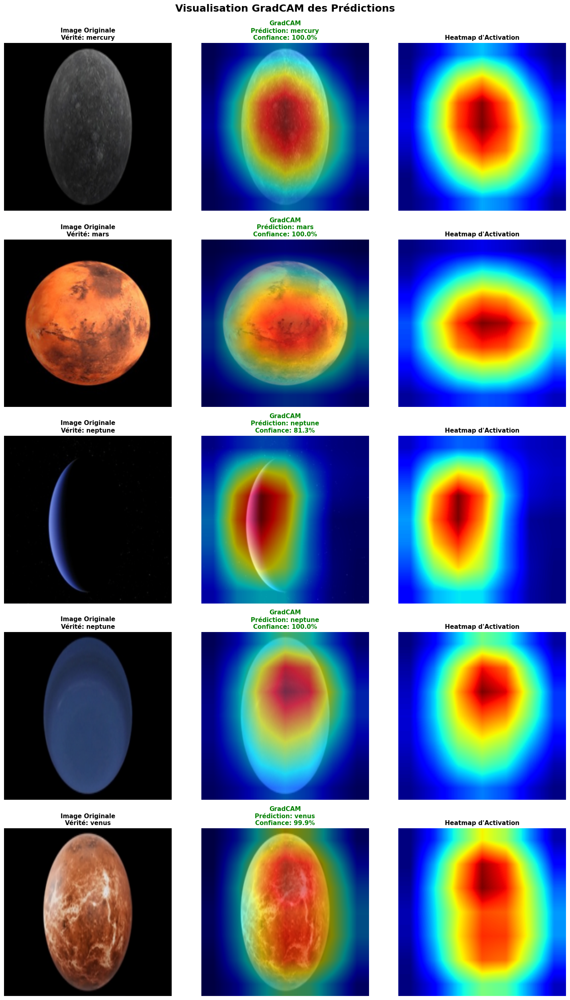

In [43]:
def visualize_gradcam_predictions(model, dataset, indices, class_names, device):

    model.eval()

    target_layer = model.layer4[-1]

    n_images = len(indices)
    fig, axes = plt.subplots(n_images, 3, figsize=(15, 5*n_images))
    if n_images == 1:
        axes = axes.reshape(1, -1)

    fig.suptitle('Visualisation GradCAM des Prédictions',
                 fontsize=18, fontweight='bold', y=0.995)

    for idx, img_idx in enumerate(indices):
        image, true_label = dataset[img_idx]
        image_tensor = image.to(device)

        with torch.no_grad():
            output = model(image_tensor.unsqueeze(0))
            prob = torch.softmax(output, dim=1)
            confidence, pred_label = prob.max(1)
            pred_label = pred_label.item()
            confidence = confidence.item()

        img_display, cam_visualization, heatmap = get_gradcam_visualization(
            model, image_tensor, true_label, pred_label, class_names, target_layer
        )

        axes[idx, 0].imshow(img_display)
        axes[idx, 0].axis('off')
        axes[idx, 0].set_title(f'Image Originale\nVérité: {class_names[true_label]}',
                               fontsize=11, fontweight='bold')

        axes[idx, 1].imshow(cam_visualization)
        axes[idx, 1].axis('off')
        color = 'green' if pred_label == true_label else 'red'
        axes[idx, 1].set_title(
            f'GradCAM\nPrédiction: {class_names[pred_label]}\nConfiance: {confidence:.1%}',
            fontsize=11, fontweight='bold', color=color
        )

        # Heatmap seule
        axes[idx, 2].imshow(heatmap, cmap='jet')
        axes[idx, 2].axis('off')
        axes[idx, 2].set_title('Heatmap d\'Activation', fontsize=11, fontweight='bold')

    plt.tight_layout()
    plt.show()

np.random.seed(42)
random_indices = np.random.choice(len(test_dataset), size=5, replace=False)
visualize_gradcam_predictions(model, test_dataset, random_indices,
                               test_dataset.classes, device)

Génération de GradCAM pour toutes les classes...



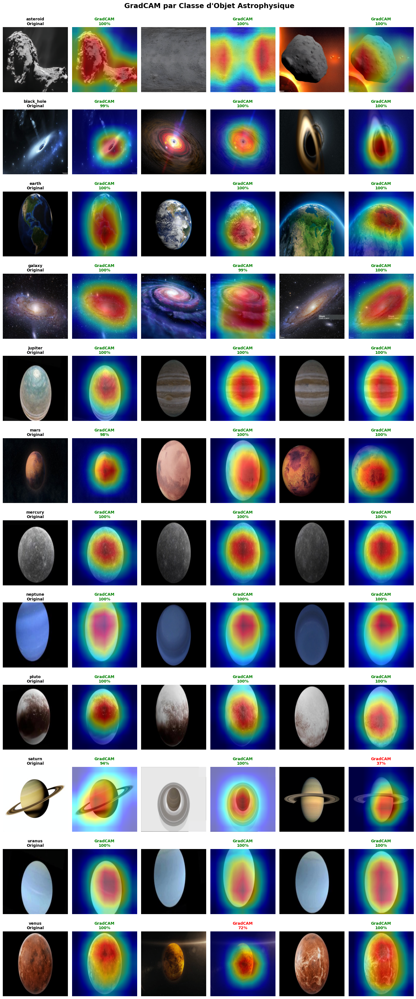

In [44]:
def visualize_gradcam_per_class(model, dataset, class_names, device, samples_per_class=2):
    """
    Visualise des exemples GradCAM pour chaque classe
    """
    model.eval()
    target_layer = model.layer4[-1]

    # Trouver des indices pour chaque classe
    class_indices = {i: [] for i in range(len(class_names))}
    for idx in range(len(dataset)):
        _, label = dataset[idx]
        if len(class_indices[label]) < samples_per_class:
            class_indices[label].append(idx)

    n_classes = len(class_names)
    fig, axes = plt.subplots(n_classes, samples_per_class * 2,
                            figsize=(5*samples_per_class, 3*n_classes))

    fig.suptitle(' GradCAM par Classe d\'Objet Astrophysique',
                 fontsize=18, fontweight='bold', y=0.998)

    for class_idx, class_name in enumerate(class_names):
        for sample_idx, img_idx in enumerate(class_indices[class_idx][:samples_per_class]):
            image, true_label = dataset[img_idx]
            image_tensor = image.to(device)

            # Prédiction
            with torch.no_grad():
                output = model(image_tensor.unsqueeze(0))
                prob = torch.softmax(output, dim=1)
                confidence, pred_label = prob.max(1)
                pred_label = pred_label.item()
                confidence = confidence.item()

            # GradCAM
            img_display, cam_visualization, _ = get_gradcam_visualization(
                model, image_tensor, true_label, pred_label, class_names, target_layer
            )

            col_original = sample_idx * 2
            col_gradcam = sample_idx * 2 + 1

            # Image originale
            axes[class_idx, col_original].imshow(img_display)
            axes[class_idx, col_original].axis('off')
            if sample_idx == 0:
                axes[class_idx, col_original].set_title(
                    f'{class_name}\nOriginal',
                    fontsize=10, fontweight='bold'
                )

            # GradCAM
            axes[class_idx, col_gradcam].imshow(cam_visualization)
            axes[class_idx, col_gradcam].axis('off')
            color = 'green' if pred_label == true_label else 'red'
            axes[class_idx, col_gradcam].set_title(
                f'GradCAM\n{confidence:.0%}',
                fontsize=10, fontweight='bold', color=color
            )

    plt.tight_layout()
    plt.show()

print("Génération de GradCAM pour toutes les classes...\n")
visualize_gradcam_per_class(model, test_dataset, test_dataset.classes, device, samples_per_class=3)

In [45]:
checkpoint = {
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'history': history,
    'class_names': train_dataset.classes,
    'best_val_acc': best_val_acc,
    'test_acc': test_acc,
    'num_classes': num_classes
}

torch.save(checkpoint, 'resnet18_astro_complete.pth')
print("Modèle complet sauvegardé dans 'resnet18_astro_complete.pth'")

# Résumé final
print(f"\n{'='*60}")
print(f"RÉSUMÉ FINAL DU PROJET")
print(f"{'='*60}")
print(f"Nombre de classes: {num_classes}")
print(f"Classes: {', '.join(train_dataset.classes)}")
print(f"Meilleure Val Accuracy: {best_val_acc:.2f}%")
print(f"Test Accuracy: {test_acc:.2f}%")
print(f"Paramètres entraînables: {trainable_params:,}")
print(f"Nombre d'époques: {num_epochs}")
print(f"{'='*60}")

Modèle complet sauvegardé dans 'resnet18_astro_complete.pth'

RÉSUMÉ FINAL DU PROJET
Nombre de classes: 12
Classes: asteroid, black_hole, earth, galaxy, jupiter, mars, mercury, neptune, pluto, saturn, uranus, venus
Meilleure Val Accuracy: 99.54%
Test Accuracy: 97.10%
Paramètres entraînables: 10,499,596
Nombre d'époques: 10
